# <b>The Battle of Neighborhoods:Final project</b>

### <b>'Ideal location to open Indoor Play Center in the Greater Melbourne'</b>
***

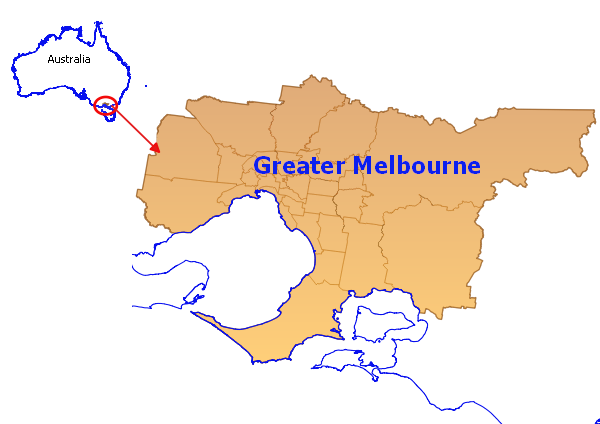

***This notebook is divided into multile sections***
1. Introduction
2. Data
3. Methodology
4. Results
5. Discussion
6. Conclusion

## <b>Introduction</b>

#### <b>Business Problem or Idea Description:</b>
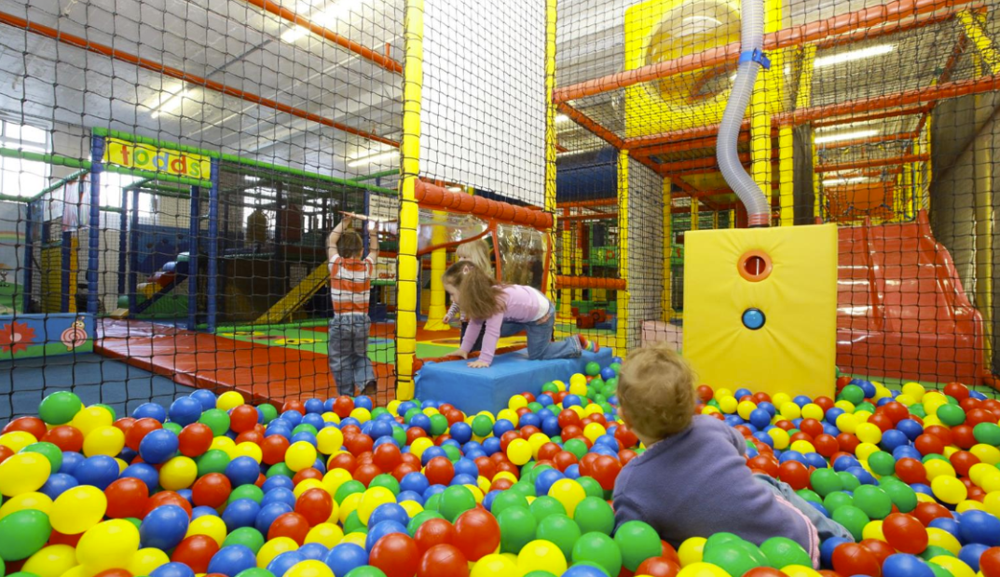
When thinking about the business idea in the context of the fastest-growing city like Melbourne, the first thing that strikes in my mind is the rapid change in the landscape and construction work happening everywhere in the city. Exponentially growing traffic consuming a major amount of people’s time in commute to the workplace, meaning less time left for kids and family. Especially it is very challenging for parents with the kids to balance between family and work. Physical activities, entertainment, and socialization are important parts of children's growth. So, every parent is keen to take their kids to park or playground and spend some quality time with them. They are looking for a community park and entertainment center which is easily accessible so that they can maximize the utilization of their spare time.

Indoor play centers are becoming popular in the Greater Melbourne communities, especially among the parents who have toddlers and young kids. Since, indoor playground facilities are safer and can be utilized in any weather condition, parents love to bring their children and letting them have fun and be happy. So, for someone who loves kids or passionate about making children happy, starting an indoor play center that can assure safety, affordability, and entertaining can be an ideal business choice. As with any business to survive and earn profit in a competitive environment, a detailed market study is essential. 

Besides, basic preparation to start a business, finding a strategic location is the most important part to open a successful business. We must analyze various factors before selecting a location that includes:
1.	Population distribution in the city 
2.	Segmentation of LGA
3.	Greater Melbourne Demographics
4.	Number of Household with young children in each council
5.	Availability of indoor playground venues near the residential location
6.	Location feasibility
7.	Competitors in the market, etc.

#### <b>Target Audience:</b>
The outcome of this project should be beneficial to anyone, who is thinking about starting a new business that focuses on children or wanting to expand the already established indoor play center at a new location. As a Data scientist my objective is to locate and recommend an ideal location in the neighborhood of the Greater Melbourne area to start a new indoor Play Center. 

#### <b>Project Goal</b>
In this project we will analyze children's population density of each city council, availability of indoor Kids activities centers in the neighborhood, and identify the possible location where the demand is higher for children play center.

## <b>Data</b>

In this project we are analysing the population and demographics of Greater Melbourne. We will use the following datasets to determine the location that has higher demand for the indoor activities center for young children, who are aged between 0 to 15 years.

1. <b>Data1: Location data that contains Lat/Long and area of LGA of Melbourne</b>
2. <b>Data2: Census data that contains population statistics of Melbourne</b>
3. <b>Data3: Neighborhood venues from Foursquare API for market analysis</b>

## <b> Methodology and Data Analysis</b>
#### <b>Data1:</b>
Greater Melbourne has 31 Local Government Area (LGA) or city councils. So, to understand the distribution of children population and segment the neighborhoods, we essentially need a dataset that contains the 31 LGA, latitude/Longitude coordinates of LGA, and area. Unfortunately, I am unable to find the online dataset that contains Lat/Long coordinates for each LGA of the Greater Melbourne area. Thus, to extract the coordinates first we need to get the boundary map of the LGA of Greater Melbourne, which can be downloaded from the Australian Bureau of Statistics (ABS) website.

Link to the website: https://itt.abs.gov.au/itt/r.jsp?ABSMaps

Local Government Areas ASGS ED 2016 Digital Boundaries data was downloaded in ESRI shapefile format. The dataset contains the entire LGA of Australia, but we are only interested in LGA of Greater Melbourne. So, to extract only the LGA of Greater Melbourne I cleaned the dataset using QGIS software. Then, I used the analysis tool in QGIS to calculate the centroid of each LGA polygonal area, which enables to extract the geographic coordinate information. Finally, the Data1 was exported as csv file. Now, let read the Greater Melbourne LGA data.

##### <b>Import Greater Melbourne LGA data</b>

In [2]:
# First Import require libraries
import numpy as np # library to handle data in a vectorized manner
import json # library to handle JSON files
import pandas as pd

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# Import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

print('Libraries imported.')



Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.22.0               |     pyh9f0ad1d_0          63 KB  conda-forge
    ------------------------------------------------------------
                                           Total:          97 KB

The following NEW packages will be INSTALLED:

  geographiclib      conda-forge/noarch::geographiclib-1.50-py_0
  geopy              conda-forge/noarch::geopy-1.22.0-pyh9f0ad1d_0



geopy-1.22.0         | 63 KB     | ##################################### | 100% 
geographiclib-1.50   | 34 KB     | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: 

In [3]:
# Download the dataset and read as a pandas dataframe.
Data1 = pd.read_csv('LGA_2016_GM_LL.csv')
Data1

,LGA_CODE,LGA_NAME,State,AREASQKM16,xcoord,ycoord
0,20660,Banyule (C),Victoria,62.5402,145.085141,-37.730441
1,20910,Bayside (C),Victoria,37.2111,145.018154,-37.941839
2,21110,Boroondara (C),Victoria,60.1774,145.063089,-37.819286
3,21180,Brimbank (C),Victoria,123.3991,144.803311,-37.747553
4,21450,Cardinia (S),Victoria,1282.5678,145.572685,-38.083014
5,21610,Casey (C),Victoria,409.4289,145.309011,-38.104350
6,21890,Darebin (C),Victoria,53.4711,145.014333,-37.733459
7,22170,Frankston (C),Victoria,129.5980,145.173799,-38.134608
8,22310,Glen Eira (C),Victoria,38.6906,145.042602,-37.901206
9,22670,Greater Dandenong (C),Victoria,129.5469,145.190009,-38.005589


In [4]:
# Rename the columns xcoord as Longitude, ycoord as Latitude, and AREASQKM16 as Area
Data1.rename(columns={'xcoord':'Longitude', 'ycoord':'Latitude', 'AREASQKM16':'Area'}, inplace=True)
Data1.head()

,LGA_CODE,LGA_NAME,State,Area,Longitude,Latitude
0,20660,Banyule (C),Victoria,62.5402,145.085141,-37.730441
1,20910,Bayside (C),Victoria,37.2111,145.018154,-37.941839
2,21110,Boroondara (C),Victoria,60.1774,145.063089,-37.819286
3,21180,Brimbank (C),Victoria,123.3991,144.803311,-37.747553
4,21450,Cardinia (S),Victoria,1282.5678,145.572685,-38.083014


In [5]:
Data1.shape

(31, 6)

We successfully obtained the dataset that contains 31 LGA lat/long coordinates and their area. Now, the next step is to get the census data to understand total population and the density of young children in each LGA.

#### <b>Data 2:</b>
For Greater Melbourne population Statistics that includes the total number of children in each LGA or the number of households with young children in each LGA we use the 2016 census data of Australia available in the Australian Bureau of Statistics (ABS) website. Note that Australian census data are available in every five-year interval since the latest census was acquired in 2016, we have to rely on that dataset.

Link to the website: http://stat.data.abs.gov.au/#

The csv data contains all the Local government area of Australia. It is a large file, so I upload it into IBM Database. Since, we only need Greater Melbourne data, so lets clean the data and extract required information.

<b> Access the census data file from the IBM Cloud</b>

In [6]:
import ibm_db

In [7]:
#Input Db2 Service Credentials
dsn_driver = "{IBM DB2 ODBC DRIVER}"
dsn_database = "BLUDB"            # e.g. "BLUDB"
dsn_hostname = "dashdb-txn-sbox-yp-dal09-04.services.dal.bluemix.net"            # e.g.: "dashdb-txn-sbox-yp-dal09-04.services.dal.bluemix.net"
dsn_port = "50000"                    # e.g. "50000" 
dsn_protocol = "TCPIP"            # i.e. "TCPIP"
dsn_uid = "cbk87291"                 # e.g. "abc12345"
dsn_pwd = "3jhhb@0bwtkvrpj4"                 # e.g. "7dBZ3wWt9XN6$o0J"

In [8]:
#Create database connection
dsn = (
    "DRIVER={0};"
    "DATABASE={1};"
    "HOSTNAME={2};"
    "PORT={3};"
    "PROTOCOL={4};"
    "UID={5};"
    "PWD={6};").format(dsn_driver, dsn_database, dsn_hostname, dsn_port, dsn_protocol, dsn_uid, dsn_pwd)

try:
    conn = ibm_db.connect(dsn, "", "")
    print ("Connected to database: ", dsn_database, "as user: ", dsn_uid, "on host: ", dsn_hostname)

except:
    print ("Unable to connect: ", ibm_db.conn_errormsg() )

Connected to database:  BLUDB as user:  cbk87291 on host:  dashdb-txn-sbox-yp-dal09-04.services.dal.bluemix.net


In [9]:
import ibm_db_dbi

#connection for pandas
pconn = ibm_db_dbi.Connection(conn)

#query statement to retrieve all rows in AUS_LGA_POPULATION table
selectQuery = "select * from AUS_LGA_POPULATION"

#retrieve the query results into a pandas dataframe
ausp = pd.read_sql(selectQuery, pconn)

#print first 5 row in the pandas data frame
ausp.head()

,SEX_ABS,Sex,AGE,Age,STATE,State,REGIONTYPE,Geography_Level,LGA_2016,Region,TIME,Census_year,Value,Flag_Codes,Flags
0,1,Males,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10050,Albury (C),2016.0,2016.0,24662.0,None,None
1,2,Females,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10050,Albury (C),2016.0,2016.0,26411.0,None,None
2,3,Persons,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10050,Albury (C),2016.0,2016.0,51076.0,None,None
3,1,Males,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10130,Armidale Regional (A),2016.0,2016.0,14227.0,None,None
4,2,Females,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10130,Armidale Regional (A),2016.0,2016.0,15220.0,None,None


In [10]:
ausp.drop(['Flag_Codes','Flags'], axis=1)

,SEX_ABS,Sex,AGE,Age,STATE,State,REGIONTYPE,Geography_Level,LGA_2016,Region,TIME,Census_year,Value
0,1,Males,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10050,Albury (C),2016.0,2016.0,24662.0
1,2,Females,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10050,Albury (C),2016.0,2016.0,26411.0
2,3,Persons,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10050,Albury (C),2016.0,2016.0,51076.0
3,1,Males,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10130,Armidale Regional (A),2016.0,2016.0,14227.0
4,2,Females,TT,All ages,1,New South Wales,LGA2016,Local Government Areas (2016),10130,Armidale Regional (A),2016.0,2016.0,15220.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
124980,1,Males,72,72,9,Other Territories,LGA2016,Local Government Areas (2016),99499,No usual address (OT),2016.0,2016.0,0.0
124981,2,Females,72,72,9,Other Territories,LGA2016,Local Government Areas (2016),99499,No usual address (OT),2016.0,2016.0,0.0
124982,3,Persons,72,72,9,Other Territories,LGA2016,Local Government Areas (2016),99499,No usual address (OT),2016.0,2016.0,0.0
124983,1,Males,72,72,9,Other Territories,LGA2016,Local Government Areas (2016),99799,Migratory - Offshore - Shipping (OT),2016.0,2016.0,0.0


In [12]:
# Extract Population data of the state of Victoria and create a new Dataframe 
vicp = ausp[ausp['State'] == 'Victoria'].reset_index(drop=True)
vicp.head()

,SEX_ABS,Sex,AGE,Age,STATE,State,REGIONTYPE,Geography_Level,LGA_2016,Region,TIME,Census_year,Value,Flag_Codes,Flags
0,1,Males,TT,All ages,2,Victoria,LGA2016,Local Government Areas (2016),20110,Alpine (S),2016.0,2016.0,6074.0,None,None
1,2,Females,TT,All ages,2,Victoria,LGA2016,Local Government Areas (2016),20110,Alpine (S),2016.0,2016.0,6265.0,None,None
2,3,Persons,TT,All ages,2,Victoria,LGA2016,Local Government Areas (2016),20110,Alpine (S),2016.0,2016.0,12337.0,None,None
3,1,Males,TT,All ages,2,Victoria,LGA2016,Local Government Areas (2016),20260,Ararat (RC),2016.0,2016.0,6152.0,None,None
4,2,Females,TT,All ages,2,Victoria,LGA2016,Local Government Areas (2016),20260,Ararat (RC),2016.0,2016.0,5449.0,None,None


In [13]:
#Drop unnecessary columns
vicp1 = vicp.drop(['Flags','Flag_Codes','Geography_Level','Census_year','SEX_ABS','AGE','STATE','REGIONTYPE','TIME'], axis=1)
vicp1

,Sex,Age,State,LGA_2016,Region,Value
0,Males,All ages,Victoria,20110,Alpine (S),6074.0
1,Females,All ages,Victoria,20110,Alpine (S),6265.0
2,Persons,All ages,Victoria,20110,Alpine (S),12337.0
3,Males,All ages,Victoria,20260,Ararat (RC),6152.0
4,Females,All ages,Victoria,20260,Ararat (RC),5449.0
...,...,...,...,...,...,...
18199,Females,72,Victoria,29499,No usual address (Vic.),14.0
18200,Persons,72,Victoria,29499,No usual address (Vic.),40.0
18201,Males,72,Victoria,29799,Migratory - Offshore - Shipping (Vic.),0.0
18202,Females,72,Victoria,29799,Migratory - Offshore - Shipping (Vic.),0.0


<b>Our goal is to analyze Greater Melbourne LGA population, so extract the dataset that only contains the 31 LGA of Greater Melbourne.</b>

In [14]:
# Now Extract the population data of 31 LGA of Greater Melbourne using the LGA_2016 id column
GMP = vicp1[vicp1['LGA_2016'].isin\
            (['20660','20910','21110','21180','21450','21610','21890','22170','22310','22670','23110','23270',\
              '23430','23670','24210','24330','24410','24600','24650','24970','25060','25250','25340','25710',\
              '25900','26350','26980','27070','27260','27350','27450'])]
GMP

,Sex,Age,State,LGA_2016,Region,Value
9,Males,All ages,Victoria,20660,Banyule (C),59222.0
10,Females,All ages,Victoria,20660,Banyule (C),62644.0
11,Persons,All ages,Victoria,20660,Banyule (C),121865.0
18,Males,All ages,Victoria,20910,Bayside (C),46229.0
19,Females,All ages,Victoria,20910,Bayside (C),50862.0
...,...,...,...,...,...,...
18187,Females,72,Victoria,27350,Yarra (C),207.0
18188,Persons,72,Victoria,27350,Yarra (C),415.0
18189,Males,72,Victoria,27450,Yarra Ranges (S),556.0
18190,Females,72,Victoria,27450,Yarra Ranges (S),633.0


In [15]:
#Reset the index
GMP.reset_index(drop=True, inplace=True)
GMP.head()

,Sex,Age,State,LGA_2016,Region,Value
0,Males,All ages,Victoria,20660,Banyule (C),59222.0
1,Females,All ages,Victoria,20660,Banyule (C),62644.0
2,Persons,All ages,Victoria,20660,Banyule (C),121865.0
3,Males,All ages,Victoria,20910,Bayside (C),46229.0
4,Females,All ages,Victoria,20910,Bayside (C),50862.0


The purpose of this project is to analyze the population of young children, aged between 0-15 years. So, we don't need the Males and Females sex rows. We will only use Persons, which is the total population of all sex(male and female) of same age category. So, we remove all Males and Females sex rows and only retain population data that contain Persons.

In [16]:
# Extract the data the contains sex equals Persons
GMP_allsex= GMP[GMP['Sex']=='Persons']

#Reset the index
GMP_allsex.reset_index(drop=True, inplace=True)
GMP_allsex

,Sex,Age,State,LGA_2016,Region,Value
0,Persons,All ages,Victoria,20660,Banyule (C),121865.0
1,Persons,All ages,Victoria,20910,Bayside (C),97087.0
2,Persons,All ages,Victoria,21110,Boroondara (C),167231.0
3,Persons,All ages,Victoria,21180,Brimbank (C),194319.0
4,Persons,All ages,Victoria,21450,Cardinia (S),94128.0
...,...,...,...,...,...,...
2289,Persons,72,Victoria,26980,Whitehorse (C),1306.0
2290,Persons,72,Victoria,27070,Whittlesea (C),1162.0
2291,Persons,72,Victoria,27260,Wyndham (C),843.0
2292,Persons,72,Victoria,27350,Yarra (C),415.0


In [17]:
GMP_allsex.shape

(2294, 6)

Now,we need to combine the population data into different age groups.
1. Age(0-15): Young Children
2. Age(16-24): Teenagers
3. Age(25-40): Adults
4. Age(40-65): Matured Adults
5. Age(66 above): Seniors

Since, Dataset is more manageable now. So, I decide to use the excel spreadsheet for calculation. And reload the final clean population data as csv file.

In [18]:
#Export into CSV 
GMP_allsex.to_csv('GMP_byLGA.csv')

In [19]:
#Import Data 2
Data2 = pd.read_csv('GMP_byLGA_Final.csv')
Data2.head()

,LGA_NAME,LGA_CODE,State,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above)
0,Banyule,20660,Victoria,121865,23260,12990,26676,39036,19903
1,Bayside,20910,Victoria,97087,19678,9836,14479,35518,17576
2,Boroondara,21110,Victoria,167231,31098,22956,34362,53597,25218
3,Brimbank,21180,Victoria,194319,38216,25072,47319,59321,24391
4,Cardinia,21450,Victoria,94128,23032,10868,21536,28289,10403


##### The next step is to merge or join ‘Data 1’ and ‘Data 2’, Then the final dataframe will be used for statistical analysis and developing a choropleth map of Greater Melbourne.

In [20]:
# Join Data 1 and Data 2
Data1_2 =pd.merge(Data1,Data2, on='LGA_CODE', how='outer')
Data1_2

,LGA_CODE,LGA_NAME_x,State_x,Area,Longitude,Latitude,LGA_NAME_y,State_y,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above)
0,20660,Banyule (C),Victoria,62.5402,145.085141,-37.730441,Banyule,Victoria,121865,23260,12990,26676,39036,19903
1,20910,Bayside (C),Victoria,37.2111,145.018154,-37.941839,Bayside,Victoria,97087,19678,9836,14479,35518,17576
2,21110,Boroondara (C),Victoria,60.1774,145.063089,-37.819286,Boroondara,Victoria,167231,31098,22956,34362,53597,25218
3,21180,Brimbank (C),Victoria,123.3991,144.803311,-37.747553,Brimbank,Victoria,194319,38216,25072,47319,59321,24391
4,21450,Cardinia (S),Victoria,1282.5678,145.572685,-38.083014,Cardinia,Victoria,94128,23032,10868,21536,28289,10403
5,21610,Casey (C),Victoria,409.4289,145.309011,-38.104350,Casey,Victoria,299301,71957,37517,71794,89633,28400
6,21890,Darebin (C),Victoria,53.4711,145.014333,-37.733459,Darebin,Victoria,146719,24611,17110,42581,42551,19866
7,22170,Frankston (C),Victoria,129.5980,145.173799,-38.134608,Frankston,Victoria,134143,26587,14963,29316,44065,19212
8,22310,Glen Eira (C),Victoria,38.6906,145.042602,-37.901206,Glen Eira,Victoria,140875,27310,16104,33881,43639,19941
9,22670,Greater Dandenong (C),Victoria,129.5469,145.190009,-38.005589,Greater Dandenong,Victoria,152050,29116,19435,40141,42821,20537


In [21]:
# Let's drop redondent column from the merge dataframe
Data12 = Data1_2.drop(['LGA_NAME_x','State_y'], axis=1)
Data12.head()

,LGA_CODE,State_x,Area,Longitude,Latitude,LGA_NAME_y,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above)
0,20660,Victoria,62.5402,145.085141,-37.730441,Banyule,121865,23260,12990,26676,39036,19903
1,20910,Victoria,37.2111,145.018154,-37.941839,Bayside,97087,19678,9836,14479,35518,17576
2,21110,Victoria,60.1774,145.063089,-37.819286,Boroondara,167231,31098,22956,34362,53597,25218
3,21180,Victoria,123.3991,144.803311,-37.747553,Brimbank,194319,38216,25072,47319,59321,24391
4,21450,Victoria,1282.5678,145.572685,-38.083014,Cardinia,94128,23032,10868,21536,28289,10403


##### Now, Lets calculate the Population Density of each city council(LGA) of Greater Melbourne and append the column in the dataframe <b>Data12</b>.

In [22]:
#append population density of the LGA
Data12['Pop_Density'] = round (Data12['Total Population']/Data12['Area'],2)
Data12.head()

,LGA_CODE,State_x,Area,Longitude,Latitude,LGA_NAME_y,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above),Pop_Density
0,20660,Victoria,62.5402,145.085141,-37.730441,Banyule,121865,23260,12990,26676,39036,19903,1948.59
1,20910,Victoria,37.2111,145.018154,-37.941839,Bayside,97087,19678,9836,14479,35518,17576,2609.09
2,21110,Victoria,60.1774,145.063089,-37.819286,Boroondara,167231,31098,22956,34362,53597,25218,2778.97
3,21180,Victoria,123.3991,144.803311,-37.747553,Brimbank,194319,38216,25072,47319,59321,24391,1574.72
4,21450,Victoria,1282.5678,145.572685,-38.083014,Cardinia,94128,23032,10868,21536,28289,10403,73.39


In [23]:
Data12.shape

(31, 13)

#### Lets calculate the Young Children population density in each LGA. 

In [24]:
#append population density of the LGA
Data12['Pop_Den_Age(0-15)'] = round(Data12['Age(0-15)']/Data12['Area'],2)
Data12.head()

,LGA_CODE,State_x,Area,Longitude,Latitude,LGA_NAME_y,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above),Pop_Density,Pop_Den_Age(0-15)
0,20660,Victoria,62.5402,145.085141,-37.730441,Banyule,121865,23260,12990,26676,39036,19903,1948.59,371.92
1,20910,Victoria,37.2111,145.018154,-37.941839,Bayside,97087,19678,9836,14479,35518,17576,2609.09,528.82
2,21110,Victoria,60.1774,145.063089,-37.819286,Boroondara,167231,31098,22956,34362,53597,25218,2778.97,516.77
3,21180,Victoria,123.3991,144.803311,-37.747553,Brimbank,194319,38216,25072,47319,59321,24391,1574.72,309.69
4,21450,Victoria,1282.5678,145.572685,-38.083014,Cardinia,94128,23032,10868,21536,28289,10403,73.39,17.96


In [25]:
# Rename the columns LGA_NAME_x as City, State_x as State as Latitude
Data12.rename(columns={'LGA_NAME_y':'City', 'State_x':'State'}, inplace=True)
Data12.head()

,LGA_CODE,State,Area,Longitude,Latitude,City,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above),Pop_Density,Pop_Den_Age(0-15)
0,20660,Victoria,62.5402,145.085141,-37.730441,Banyule,121865,23260,12990,26676,39036,19903,1948.59,371.92
1,20910,Victoria,37.2111,145.018154,-37.941839,Bayside,97087,19678,9836,14479,35518,17576,2609.09,528.82
2,21110,Victoria,60.1774,145.063089,-37.819286,Boroondara,167231,31098,22956,34362,53597,25218,2778.97,516.77
3,21180,Victoria,123.3991,144.803311,-37.747553,Brimbank,194319,38216,25072,47319,59321,24391,1574.72,309.69
4,21450,Victoria,1282.5678,145.572685,-38.083014,Cardinia,94128,23032,10868,21536,28289,10403,73.39,17.96


In [26]:
# let's examine the types of the column labels
all(isinstance(column, str) for column in Data12.columns)

True

In [27]:
#let's create the dataframe that contain City and population density
City_PD=Data12.filter(['City','Area','Pop_Density','Pop_Den_Age(0-15)'],axis=1)
City_PD.head()

,City,Area,Pop_Density,Pop_Den_Age(0-15)
0,Banyule,62.5402,1948.59,371.92
1,Bayside,37.2111,2609.09,528.82
2,Boroondara,60.1774,2778.97,516.77
3,Brimbank,123.3991,1574.72,309.69
4,Cardinia,1282.5678,73.39,17.96


In [28]:
City_PD.set_index('City', inplace=True)
City_PD.head()

,Area,Pop_Density,Pop_Den_Age(0-15)
City,,,
Banyule,62.5402,1948.59,371.92
Bayside,37.2111,2609.09,528.82
Boroondara,60.1774,2778.97,516.77
Brimbank,123.3991,1574.72,309.69
Cardinia,1282.5678,73.39,17.96


#### Let's create a bar chart to visualize the population density in each city(LGA)

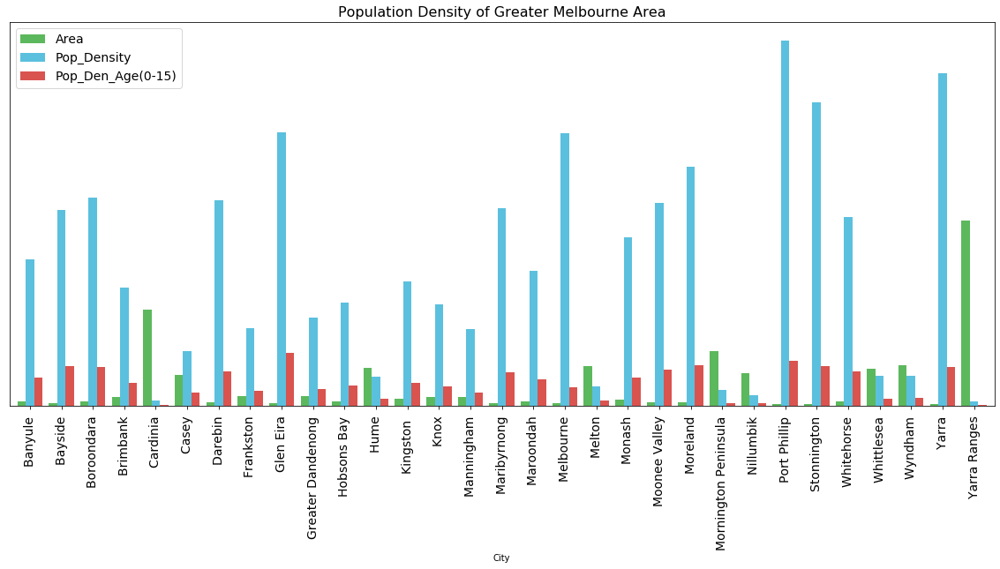

In [29]:
#plotting
import matplotlib.patches as patches
ax=City_PD.plot(kind='bar', figsize=(20,8),color=['#5cb85c','#5bc0de','#d9534f'],width=0.8, fontsize=14)
                     
#setting plot title, legend and facecolor                    
ax.set_title('Population Density of Greater Melbourne Area',fontsize=16)
ax.set_facecolor('white')
ax.legend(fontsize=14, facecolor='white')
#Removing the border
ax.get_yaxis().set_visible(False)

#Creating a function to display the percentage.
plt.savefig ("Population Density of Greater Melbourne.png", dpi=240)
plt.show()

In [30]:
City_PD1= City_PD.reset_index()
City_PD1.head()

,City,Area,Pop_Density,Pop_Den_Age(0-15)
0,Banyule,62.5402,1948.59,371.92
1,Bayside,37.2111,2609.09,528.82
2,Boroondara,60.1774,2778.97,516.77
3,Brimbank,123.3991,1574.72,309.69
4,Cardinia,1282.5678,73.39,17.96


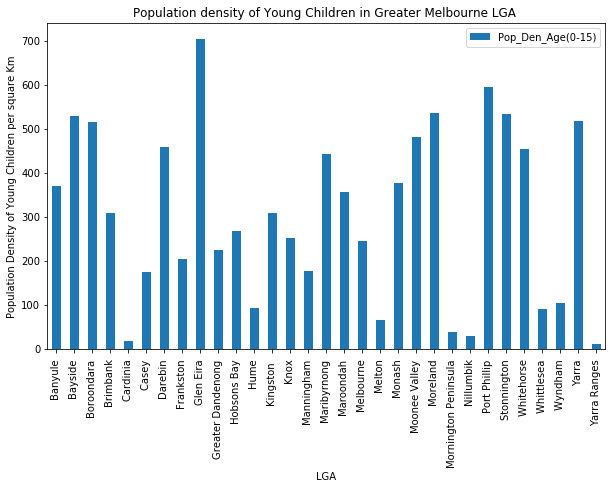

In [31]:
#Filter City_PD1 to extract two variables city and Pop_Den_Age(0-15)
City_PD2 = City_PD1.filter(['City','Pop_Den_Age(0-15)'],axis=1)
City_PD2.set_index('City', inplace=True)

#Plot bar chart
City_PD2.plot(kind='bar', figsize=(10, 6))

plt.xlabel('LGA') # add to x-label to the plot
plt.ylabel('Population Density of Young Children per square Km') # add y-label to the plot
plt.title('Population density of Young Children in Greater Melbourne LGA ') # add title to the plot
plt.savefig ("Population Density of Young Children.png", dpi=240)
plt.show()

### <b>Result 1</b>
1. Analysis of Population density shows that the higher demand for Indoor Play Center is in the city of Glen Eira, follows by 'Port Phillip', 'Moreland', 'Stonnington', and 'Bayside'. 
So,Let's further analyze Top 10 city in the list to select the best location.

In [32]:
# Top 10 LGA by Population Density of Young children
City_PD1.nlargest(10,['Pop_Den_Age(0-15)'])

,City,Area,Pop_Density,Pop_Den_Age(0-15)
8,Glen Eira,38.6906,3641.07,705.86
24,Port Phillip,20.7092,4870.44,594.90
21,Moreland,50.9519,3190.42,537.70
25,Stonnington,25.6514,4047.81,534.24
1,Bayside,37.2111,2609.09,528.82
29,Yarra,19.5425,4434.28,518.41
2,Boroondara,60.1774,2778.97,516.77
20,Moonee Valley,43.1386,2704.56,481.75
6,Darebin,53.4711,2743.89,460.27
26,Whitehorse,64.2800,2521.44,454.03


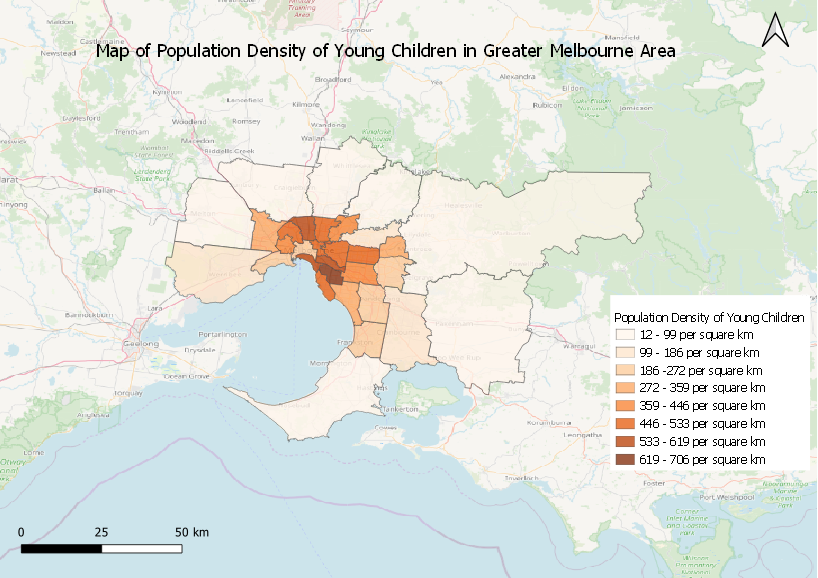

##### So, we find Top 10 cities where the density of young children population is higher, which means these city councils may have higher demand for Kids Activities Center. Now, let's analyze neighborhood venues in the Greater Melbourne so that we can track down the competition in the market. We will use Foursquare API for the analysis.
#### <b>Data3:</b>

The geograpical coordinate of the center point of Greater Melbourne are <b>-37.8518578597</b> and <b>145.2676919940</b> which is obtained using QGIS coordinate extraction tool is boundary shape file.

In [33]:
Data12.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 31 entries, 0 to 30
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   LGA_CODE           31 non-null     int64  
 1   State              31 non-null     object 
 2   Area               31 non-null     float64
 3   Longitude          31 non-null     float64
 4   Latitude           31 non-null     float64
 5   City               31 non-null     object 
 6   Total Population   31 non-null     int64  
 7   Age(0-15)          31 non-null     int64  
 8   Age(16-24)         31 non-null     int64  
 9   Age(25-40)         31 non-null     int64  
 10  Age(41-65)         31 non-null     int64  
 11  Age(66 above)      31 non-null     int64  
 12  Pop_Density        31 non-null     float64
 13  Pop_Den_Age(0-15)  31 non-null     float64
dtypes: float64(5), int64(7), object(2)
memory usage: 3.6+ KB


In [34]:
GM_geo = r'GM.geojson' # geojson file

# create a plain GM map
GM_map = folium.Map(location=[-37.8518578597, 145.2676919940], zoom_start=8)
GM_map

# generate choropleth map using the Population density of kids in each LGA 
GM_map.choropleth(
    geo_data=GM_geo,
    data=Data12,
    columns=['City', 'Pop_Den_Age(0-15)'],
    key_on='feature.properties.City',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Population Density of Greater Melbourne'
)

# add markers to map
for lat, lng, label in zip(Data12['Latitude'], Data12['Longitude'], Data12['City']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=4,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.3,
        parse_html=False).add_to(GM_map)  

# display map
plt.savefig ("PD map.png", dpi=240)            
GM_map

<Figure size 432x288 with 0 Axes>

## Use Foursquare API to explore Greater Melbourne
Define Foursquare Credentials and Version

In [35]:
CLIENT_ID = '43A5NRTRNT3AFON1XV2WYDJIGIOCPVYYZ1HRZU303OPW1SAO' # your Foursquare ID
CLIENT_SECRET = 'JXPVNKGR3FWE0U0BOZYS4HBWA5FSO4IAH0NVWMST0QRNBW1V' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 43A5NRTRNT3AFON1XV2WYDJIGIOCPVYYZ1HRZU303OPW1SAO
CLIENT_SECRET:JXPVNKGR3FWE0U0BOZYS4HBWA5FSO4IAH0NVWMST0QRNBW1V


Now we will focus on Top 10 city councils (LGA) that have higher density of young children. Let's create a Dataframe that contains these cities.

In [36]:
top10 = Data12.nlargest(10,['Pop_Den_Age(0-15)'])
top10.reset_index(drop=True, inplace=True)
top10

,LGA_CODE,State,Area,Longitude,Latitude,City,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above),Pop_Density,Pop_Den_Age(0-15)
0,22310,Victoria,38.6906,145.042602,-37.901206,Glen Eira,140875,27310,16104,33881,43639,19941,3641.07,705.86
1,25900,Victoria,20.7092,144.965797,-37.851816,Port Phillip,100863,12320,8895,37900,31028,10720,4870.44,594.90
2,25250,Victoria,50.9519,144.948888,-37.729919,Moreland,162558,27397,18697,51968,43335,21161,3190.42,537.70
3,26350,Victoria,25.6514,145.033657,-37.857955,Stonnington,103832,13704,13407,33632,28235,14854,4047.81,534.24
4,20910,Victoria,37.2111,145.018154,-37.941839,Bayside,97087,19678,9836,14479,35518,17576,2609.09,528.82
5,27350,Victoria,19.5425,144.998549,-37.802281,Yarra,86657,10131,9304,35914,22865,8443,4434.28,518.41
6,21110,Victoria,60.1774,145.063089,-37.819286,Boroondara,167231,31098,22956,34362,53597,25218,2778.97,516.77
7,25060,Victoria,43.1386,144.895762,-37.749500,Moonee Valley,116671,20782,13114,28568,36585,17622,2704.56,481.75
8,21890,Victoria,53.4711,145.014333,-37.733459,Darebin,146719,24611,17110,42581,42551,19866,2743.89,460.27
9,26980,Victoria,64.2800,145.155060,-37.830249,Whitehorse,162078,29185,21522,35421,49140,26810,2521.44,454.03


<b>Explore the number one city in the 'top10' dataframe to become familiar with the data</b>

In [37]:
# Explore the first Neighborhood in our dataframe.
# Get the City name.
top10.loc[0, 'City']


'Glen Eira '

In [38]:
#Get the Neighborhood's latitude and longitude values.

neighborhood_latitude = top10.loc[0, 'Latitude'] # Neighborhood latitude value
neighborhood_longitude = top10.loc[0, 'Longitude'] # Neighborhood longitude value

neighborhood_name = top10.loc[0, 'City'] # Neighborhood name

print('Latitude and longitude values of the city {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of the city Glen Eira  are -37.90120582, 145.0426025.


<b>Let's get the top 100 venues that are in the city Glen Eira within a radius of 1000 meters</b>


In [39]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 1000 # define radius

url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)
url # displays the URL

'https://api.foursquare.com/v2/venues/explore?&client_id=43A5NRTRNT3AFON1XV2WYDJIGIOCPVYYZ1HRZU303OPW1SAO&client_secret=JXPVNKGR3FWE0U0BOZYS4HBWA5FSO4IAH0NVWMST0QRNBW1V&v=20180605&ll=-37.90120582,145.0426025&radius=1000&limit=100'

In [40]:
# Send the GET request and examine the resutls
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5ecb25719c6f59001bdb59b3'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 22,
  'suggestedBounds': {'ne': {'lat': -37.89220581099999,
    'lng': 145.05398703088426},
   'sw': {'lat': -37.91020582900001, 'lng': 145.03121796911572}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4e48835ab61c03d0cd283442',
       'name': 'Gauge Espresso',
       'location': {'address': '3 Katandra Rd.',
        'lat': -37.903569086167394,
        'lng': 145.03995250292095,
        'labeledLatLngs': [{'label': 'display',
          'lat': -37

In [41]:
# define a function that extracts the category of the venue

def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [42]:
# Clean the json and structure it into a pandas dataframe.

venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head(20)


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  """


,name,categories,lat,lng
0,Gauge Espresso,Café,-37.903569,145.039953
1,On Top Bar,Bar,-37.903473,145.039006
2,Mountain Of Bears,Coffee Shop,-37.904180,145.039860
3,Jimmy Grants,Greek Restaurant,-37.904230,145.040280
4,Remezzo,Tapas Restaurant,-37.904220,145.040200
5,Mr Brightside,Café,-37.896657,145.036070
6,E E Gunn Reserve,Playground,-37.897268,145.038311
7,The Ormond Provedore,Breakfast Spot,-37.905693,145.052472
8,Subway,Sandwich Place,-37.903870,145.041320
9,McDonald's,Fast Food Restaurant,-37.905007,145.044238


In [43]:
# Let's check how many venues there are in 3eme Ardt within a radius of 500 meters
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))


22 venues were returned by Foursquare.


##### <b>Let's create a nearby venues function for all top 10 cities in Greater Melbourne.</b>

In [44]:
def getNearbyVenues(names, latitudes, longitudes, radius=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['City', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [45]:
# Create a new dataframe called GMelbourne_venues.
GMelbourne_venues = getNearbyVenues(names=top10['City'],
                                   latitudes=top10['Latitude'],
                                   longitudes=top10['Longitude']
                                  )

print(GMelbourne_venues.shape)
GMelbourne_venues.head(100)

Glen Eira 
Port Phillip 
Moreland 
Stonnington 
Bayside 
Yarra 
Boroondara 
Moonee Valley 
Darebin 
Whitehorse 
(339, 7)


,City,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Glen Eira,-37.901206,145.042602,Gauge Espresso,-37.903569,145.039953,Café
1,Glen Eira,-37.901206,145.042602,On Top Bar,-37.903473,145.039006,Bar
2,Glen Eira,-37.901206,145.042602,Mountain Of Bears,-37.904180,145.039860,Coffee Shop
3,Glen Eira,-37.901206,145.042602,Jimmy Grants,-37.904230,145.040280,Greek Restaurant
4,Glen Eira,-37.901206,145.042602,Remezzo,-37.904220,145.040200,Tapas Restaurant
...,...,...,...,...,...,...,...
95,Stonnington,-37.857955,145.033657,Prickly Pear,-37.863110,145.027990,Café
96,Stonnington,-37.857955,145.033657,Neon Tiger,-37.852540,145.036295,Café
97,Stonnington,-37.857955,145.033657,Malvern Hotel,-37.851592,145.029939,Beer Garden
98,Stonnington,-37.857955,145.033657,Cooper and Milla's,-37.855934,145.023722,Breakfast Spot


<b> Let's check how many venues were returned for each neighborhood </b>\
Note: 100 venues limit is imposed by the free Foursquare account.

In [46]:
GMelbourne_venues.groupby('City').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
City,,,,,,
Bayside,14,14,14,14,14,14
Boroondara,28,28,28,28,28,28
Darebin,18,18,18,18,18,18
Glen Eira,22,22,22,22,22,22
Moonee Valley,6,6,6,6,6,6
Moreland,23,23,23,23,23,23
Port Phillip,26,26,26,26,26,26
Stonnington,90,90,90,90,90,90
Whitehorse,19,19,19,19,19,19


Let's find out how many unique categories can be curated from all the returned venues

In [47]:
# Calculate how many unique categories there are.
print('There are {} unique venue categories.'.format(len(GMelbourne_venues['Venue Category'].unique())))

There are 102 unique venue categories.


### <b>Analyze each of the Neighborhoods</b>

In [48]:
# Analyze each of the Neighborhoods from the results

# one hot encoding
GMelbourne_onehot = pd.get_dummies(GMelbourne_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
GMelbourne_onehot['City'] = GMelbourne_venues['City'] 

# move neighborhood column to the first column
fixed_columns = [GMelbourne_onehot.columns[-1]] + list(GMelbourne_onehot.columns[:-1])
GMelbourne_onehot = GMelbourne_onehot[fixed_columns]

GMelbourne_onehot

,City,Adult Boutique,Afghan Restaurant,Antique Shop,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bakery,Bar,...,Thai Restaurant,Thrift / Vintage Store,Track,Train,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Wine Bar
0,Glen Eira,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Glen Eira,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,Glen Eira,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Glen Eira,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Glen Eira,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
334,Whitehorse,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
335,Whitehorse,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
336,Whitehorse,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
337,Whitehorse,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


Group rows by neighborhood and take the mean of the frequency of occurrence of each category

In [49]:
GMelbourne_grouped = GMelbourne_onehot.groupby('City').mean().reset_index()
GMelbourne_grouped

,City,Adult Boutique,Afghan Restaurant,Antique Shop,Asian Restaurant,Athletics & Sports,Australian Restaurant,BBQ Joint,Bakery,Bar,...,Thai Restaurant,Thrift / Vintage Store,Track,Train,Train Station,Turkish Restaurant,Vegetarian / Vegan Restaurant,Video Store,Vietnamese Restaurant,Wine Bar
0,Bayside,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,Boroondara,0.000000,0.035714,0.035714,0.000000,0.000000,0.000000,0.000000,0.035714,0.071429,...,0.035714,0.000000,0.000000,0.035714,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000
2,Darebin,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.055556,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,Glen Eira,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.045455,0.045455,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,Moonee Valley,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
5,Moreland,0.000000,0.000000,0.000000,0.000000,0.000000,0.043478,0.000000,0.130435,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,Port Phillip,0.000000,0.000000,0.000000,0.000000,0.076923,0.038462,0.038462,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,Stonnington,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.022222,0.000000,...,0.022222,0.000000,0.000000,0.000000,0.000000,0.011111,0.000000,0.000000,0.011111,0.011111
8,Whitehorse,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.105263,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.052632,0.000000,0.000000
9,Yarra,0.021505,0.000000,0.000000,0.021505,0.000000,0.000000,0.010753,0.021505,0.021505,...,0.053763,0.010753,0.000000,0.000000,0.010753,0.000000,0.032258,0.000000,0.172043,0.000000


#### Let's print each neighborhood along with the top 10 most common venues

In [50]:
# Each city with top 10 most common venues
num_top_venues = 10

for hood in GMelbourne_grouped['City']:
    print("----"+hood+"----")
    temp = GMelbourne_grouped[GMelbourne_grouped['City'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bayside ----
                 venue  freq
0                 Café  0.21
1          Supermarket  0.07
2          Gas Station  0.07
3                Field  0.07
4                 Park  0.07
5    Convenience Store  0.07
6           Sports Bar  0.07
7          Sports Club  0.07
8  Fried Chicken Joint  0.07
9           Playground  0.07


----Boroondara ----
                venue  freq
0                Café  0.21
1                Park  0.11
2         Pizza Place  0.07
3                 Bar  0.07
4       Train Station  0.07
5   Convenience Store  0.07
6  Seafood Restaurant  0.04
7     Thai Restaurant  0.04
8   Afghan Restaurant  0.04
9  Light Rail Station  0.04


----Darebin ----
                venue  freq
0                Café  0.22
1          Food Truck  0.11
2  Light Rail Station  0.11
3   Indian Restaurant  0.06
4            Bus Line  0.06
5          Board Shop  0.06
6         Music Venue  0.06
7   Martial Arts Dojo  0.06
8         Pizza Place  0.06
9           BBQ Joint  0.06


----G

<b>Now let's put the top 10 venues list into a dataframe.</b>

In [51]:
#Function to sort the venues in descending order
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [52]:
# create the new dataframe and display the top 10 venues for each city
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['City']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
city_venues_sorted = pd.DataFrame(columns=columns)
city_venues_sorted['City'] = GMelbourne_grouped['City']

for ind in np.arange(GMelbourne_grouped.shape[0]):
    city_venues_sorted.iloc[ind, 1:] = return_most_common_venues(GMelbourne_grouped.iloc[ind, :], num_top_venues)

city_venues_sorted.head(10)

,City,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bayside,Café,Sports Bar,Basketball Court,Convenience Store,Playground,Field,Sports Club,Supermarket,Park,Gas Station
1,Boroondara,Café,Park,Bar,Train Station,Convenience Store,Pizza Place,Dumpling Restaurant,Seafood Restaurant,Italian Restaurant,Light Rail Station
2,Darebin,Café,Light Rail Station,Food Truck,Pizza Place,Bus Line,Board Shop,Japanese Restaurant,Fast Food Restaurant,Indian Restaurant,Martial Arts Dojo
3,Glen Eira,Café,Burger Joint,Grocery Store,Sandwich Place,Japanese Restaurant,Breakfast Spot,Lighting Store,Indian Restaurant,Food & Drink Shop,Coffee Shop
4,Moonee Valley,Grocery Store,Coffee Shop,Park,Café,Bus Line,Food & Drink Shop,Wine Bar,Fish & Chips Shop,Electronics Store,Falafel Restaurant
5,Moreland,Café,Shopping Mall,Bakery,Supermarket,Chinese Restaurant,Soccer Field,Paper / Office Supplies Store,Liquor Store,Fish & Chips Shop,Park
6,Port Phillip,Café,Grocery Store,Athletics & Sports,Light Rail Station,Breakfast Spot,Beach,Golf Course,Indian Restaurant,Deli / Bodega,Racetrack
7,Stonnington,Café,Italian Restaurant,Pizza Place,Coffee Shop,Japanese Restaurant,Light Rail Station,Chinese Restaurant,Fast Food Restaurant,Supermarket,Liquor Store
8,Whitehorse,Fast Food Restaurant,Grocery Store,Café,Thai Restaurant,Burger Joint,Lake,Park,Sandwich Place,Supermarket,Indian Restaurant
9,Yarra,Café,Vietnamese Restaurant,Thai Restaurant,Pub,Vegetarian / Vegan Restaurant,Korean Restaurant,Grocery Store,Adult Boutique,Farmers Market,Chinese Restaurant


Now,we have obtained the venues information which are location within one kilometer radius from the center of each Top 10 cities. Let see which city has greater concentration of <b>Shopping Mall</b>,<b>Grocery Store</b> and Supermarket where people with kids visited frequently. I have picked these three venues based on my personal experience and market observation.

Let's use a violin plot from the seaborn library. It is a great way to visualize frequency distribution datasets, they display a density estimation of the underlying distribution.

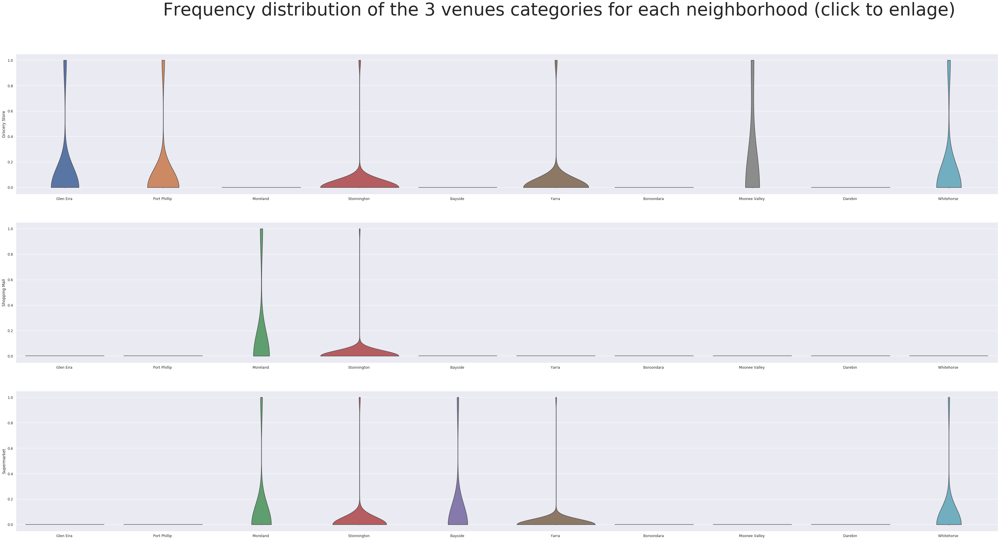

In [53]:
# Violin plot
# The 3 venues type used for the plotting.

import seaborn as sns

fig = plt.figure(figsize=(60,30))
sns.set(font_scale=1.1)

ax = plt.subplot(3,1,1)
sns.violinplot(x="City", y="Grocery Store", data=GMelbourne_onehot, cut=0);
plt.xlabel("")

ax = plt.subplot(3,1,2)
sns.violinplot(x="City", y="Shopping Mall", data=GMelbourne_onehot, cut=0);
plt.xlabel("")

ax = plt.subplot(3,1,3)
sns.violinplot(x="City", y="Supermarket", data=GMelbourne_onehot, cut=0);
plt.xlabel("")

ax.text(1.0, 4.0, 'Frequency distribution of the 3 venues categories for each neighborhood (click to enlage)', fontsize=60)
plt.savefig ("Distribution_Frequency_Venues_3_categories.png", dpi=240)
plt.show()


#### <b>Result 2</b>
2. The violin plot shows that City of Stonnington has higher frequency of 3 venues follows by Moreland, Yarra, Glen Eira, and Port Phillip.


Now, Let see if there are any Playground or Kids Activities Center in these cities.

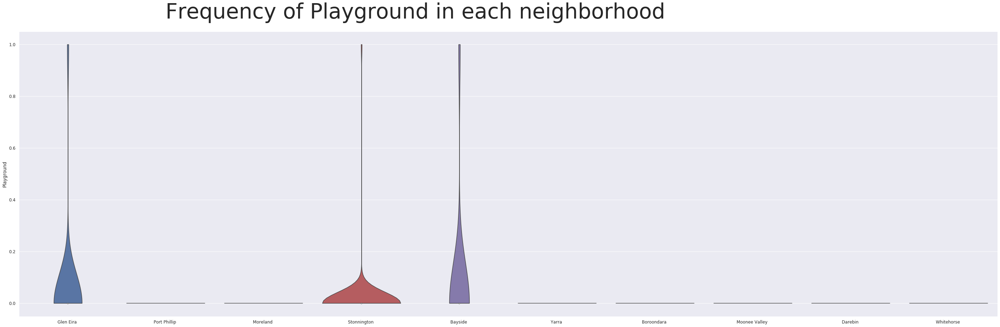

In [54]:
# Exploring Playground 
import seaborn as sns

fig = plt.figure(figsize=(50,15))
sns.set(font_scale=1.1)

ax = plt.subplot(1,1,1)
sns.violinplot(x="City", y="Playground", data=GMelbourne_onehot, cut=0);
plt.xlabel("")

ax.text(1.0, 1.1, 'Frequency of Playground in each neighborhood', fontsize=60)
plt.savefig ("Distribution_Frequency_Playground.png", dpi=240)
plt.show()

#### <b>Discussion</b>
The objective of this data analysis project is to locate and recommend an ideal location in the neighborhood of the Greater Melbourne area to start a new indoor Play Center. For this we segmented the data into 31 Local Government Area (LGA) or City Councils that constitute the Greater Melbourne Area. The first result of the population data analysis shows that 'Glen Eira' is the city with highest population density of young children in the Greater Melbourne area, follows by 'Port Phillip', 'Moreland','Stonnington', and 'Bayside'. The folium map plot shows that all these city councils are the neighboring city of central Melbourne. So, it is no surprised that the population density is higher in these LGA. This means these are the location where the demand for Indoor Play Center is higher. Now, to narrow down the ideal location we did further analysis on the venues in this location that may influence the feasibility and profitability of the play cneter business.    

As our major target is the working parents with younger kids who are looking for the place like community park, entertainment center which is easily accessible so that they can maximize the utilization of their spare time with their kids. So, time and distance to the venue play important role in this analysis. Therefore, we decided to pick center point of each LGA to explore for venues using Foursquare API. Based on the market observation and my personal experience usually families with children are mostly seen near Grocery Store, Supermarket, and Shopping Mall. So, we analysis the frequency distribution of these venues around 1000 meter radius from the center point of each LGA. The violin plot shows that <b>'Stonnington'</b> has the highest concentration of all the 3 venues that can influence the business location. Besides Stonnington all top 5 cities has some frequency of 3 venues. Similarly, <b>'Moreland'</b> can be picked as our second best location, where the flow of people is higher because it has higher frequency of Shopping Mall and Supermarket. <b>'Glen Eira'</b> fall down to third best choice in our analysis because of the lack of Shopping Mall and Supermarket. Even though Glen Eira  has highest density of young children, it is the neighboring city that share most of it boundary with Stonnington, so our selection of Stonnington is still valid. 

<b> Now let's explore where our top five place located in the map of Greater Melbourne</b>


In [55]:
# Top 5 LGA by Population Density of Young children
top5_city = Data12.nlargest(5,['Pop_Den_Age(0-15)'])
top5_city.reset_index(drop=True, inplace=True)
top5_city

,LGA_CODE,State,Area,Longitude,Latitude,City,Total Population,Age(0-15),Age(16-24),Age(25-40),Age(41-65),Age(66 above),Pop_Density,Pop_Den_Age(0-15)
0,22310,Victoria,38.6906,145.042602,-37.901206,Glen Eira,140875,27310,16104,33881,43639,19941,3641.07,705.86
1,25900,Victoria,20.7092,144.965797,-37.851816,Port Phillip,100863,12320,8895,37900,31028,10720,4870.44,594.90
2,25250,Victoria,50.9519,144.948888,-37.729919,Moreland,162558,27397,18697,51968,43335,21161,3190.42,537.70
3,26350,Victoria,25.6514,145.033657,-37.857955,Stonnington,103832,13704,13407,33632,28235,14854,4047.81,534.24
4,20910,Victoria,37.2111,145.018154,-37.941839,Bayside,97087,19678,9836,14479,35518,17576,2609.09,528.82


Explore the location of the top 5 choice for opening indoor play center.

In [56]:
#let's check the location of top 5 chosen city for opening indoor play center
# create a  GM1 map
GM1_map = folium.Map(location=[-37.8518578597, 145.2676919940], zoom_start=10)
GM1_map
# generate choropleth map using the Population density of kids in each LGA 
GM1_map.choropleth(
    geo_data=GM_geo,
    data=Data12,
    columns=['City', 'Pop_Den_Age(0-15)'],
    key_on='feature.properties.City',
    fill_color='YlOrRd', 
    fill_opacity=0.2, 
    line_opacity=0.7,
    legend_name='Population Density of Greater Melbourne'
)

# add markers to map
for lat, lng, label in zip(top5_city['Latitude'], top5_city['Longitude'], top5_city['City']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=8,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.3,
        parse_html=False).add_to(GM1_map)  
    
# display map
plt.savefig ("Top5 City plot.png", dpi=240)
GM1_map

<Figure size 432x288 with 0 Axes>

So, if you look at the location of Stonnington, it is ideally situation at the center part of Greater Melbourne. Similarly, it is surrounded by the cities with higher population density of young children. In addition, it has the best public transportation facility. The center point of the city is situated right around primary and secondary schools, church, cricket ground and park. 

In [61]:
#lets zoom into the Stonnington Center Point Location
# create a  GM2 map
GM2_map = folium.Map(location=[-37.857955, 145.033657], zoom_start=17)
GM2_map


# add markers to map
City = 'Stonnington'
circle_lat = -37.857955
circle_lon = 145.033657

folium.Circle([circle_lat, circle_lon], 150000, fill=True).add_child(folium.Popup('Stonnington')).add_to(GM2_map)

    
# display map
plt.savefig ("Stonnington.png", dpi=240)
GM2_map

<Figure size 432x288 with 0 Axes>

#### <b>Conclusion</b>
Physical activities and socialization are important parts of children's growth. Every parent wants their kids to enjoy there life and grow up in the best possible environment as possible. They want to give as much time as possible to their children, so that they can provide proper guidance and support. In the busy city life balancing time between family and work is very tough.So, city parents are looking for the place like community park, entertainment center which is easily accessible so that they can maximize the utilization of their spare time with their kids. One of the option can be indoor play center, especially for the parents who have toddlers and young kids. 

For someone who decided to open a new indoor play center should know where are the concentration of his target clients so that he can earn as much profit as possible. Based on our analysis Stonnington city council is an ideal location to open the Indoor Play Center. It has top 5 population density of young children among all Local Government Area of Greater Melbourne. It is one of the busiest location with shopping mall, grocery store, and supermarket. Our second best choice is Moreland, follows by Glen Eira, Port Phillip, and Bayside. The accuracy of this project analysis results are limited to the Foursquare API database and selection of the parameters. The selection may changes with the availability of accurate dataset. But, for the statistical and geospatial analysis we are quite confident with the outcome.


<b>Thank you</b>